In [10]:
# SETUP — Run this first
import cv2
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams["figure.figsize"] = (8, 5)

def compare_images(images, titles, cmap="gray", cols=3, figsize=(16, 10)):
    rows = int(np.ceil(len(images) / cols))
    plt.figure(figsize=figsize)
    for i, (img, title) in enumerate(zip(images, titles), start=1):
        plt.subplot(rows, cols, i)
        if len(img.shape) == 2:
            plt.imshow(img, cmap=cmap)
        else:
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(title)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

def plot_histogram(img, title="Histogram"):
    plt.figure(figsize=(7, 4))
    plt.hist(img.ravel(), bins=256, range=[0, 256])
    plt.title(title); plt.xlabel("Pixel Intensity"); plt.ylabel("Frequency"); plt.show()

img_color = cv2.imread("/content/moon.jpg")
img_gray  = cv2.cvtColor(img_color, cv2.COLOR_BGR2GRAY)
img_f     = img_gray.astype(np.float32)

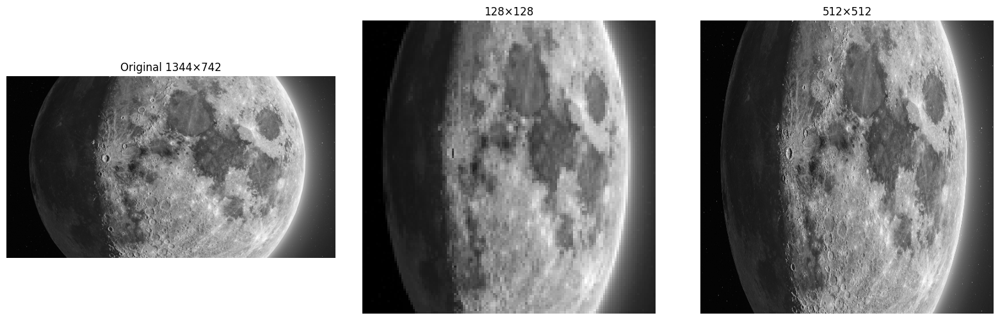

In [11]:
# TASK 1 — Resize to 128×128 and 512×512
r128 = cv2.resize(img_gray, (128, 128), interpolation=cv2.INTER_AREA)
r512 = cv2.resize(img_gray, (512, 512), interpolation=cv2.INTER_CUBIC)

compare_images(
    [img_gray, r128, r512],
    [f"Original {img_gray.shape[1]}×{img_gray.shape[0]}", "128×128", "512×512"],
    cols=3, figsize=(16, 5)
)

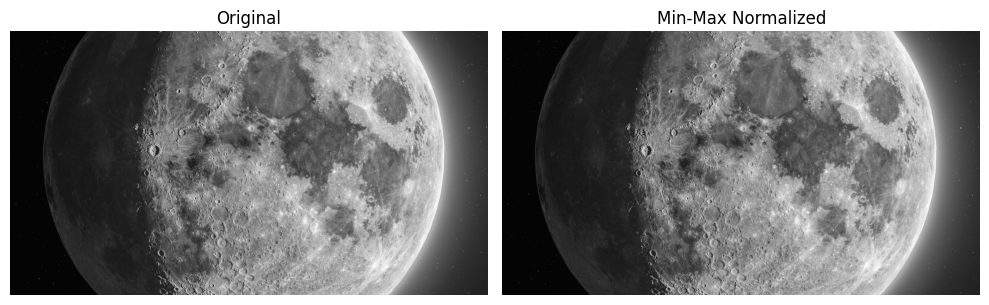

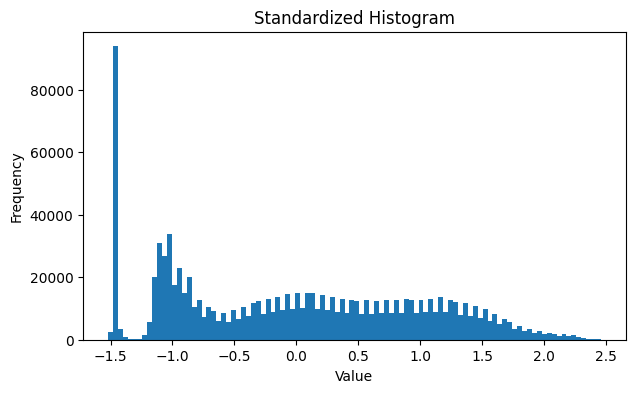

In [12]:
# TASK 2 — Manual Min-Max Normalization + Standardization
manual_mm    = (img_f - img_f.min()) / (img_f.max() - img_f.min() + 1e-8)
standardized = (img_f - img_f.mean()) / (img_f.std() + 1e-8)

compare_images(
    [img_gray, (manual_mm * 255).astype(np.uint8)],
    ["Original", "Min-Max Normalized"],
    cols=2, figsize=(10, 5)
)

plt.figure(figsize=(7, 4))
plt.hist(standardized.ravel(), bins=100)
plt.title("Standardized Histogram"); plt.xlabel("Value"); plt.ylabel("Frequency"); plt.show()

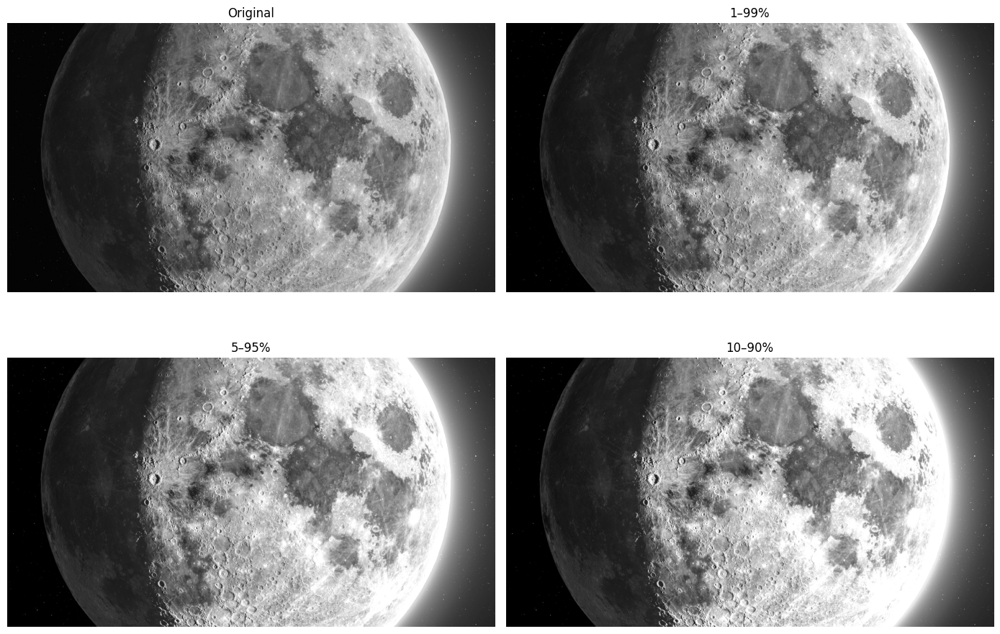

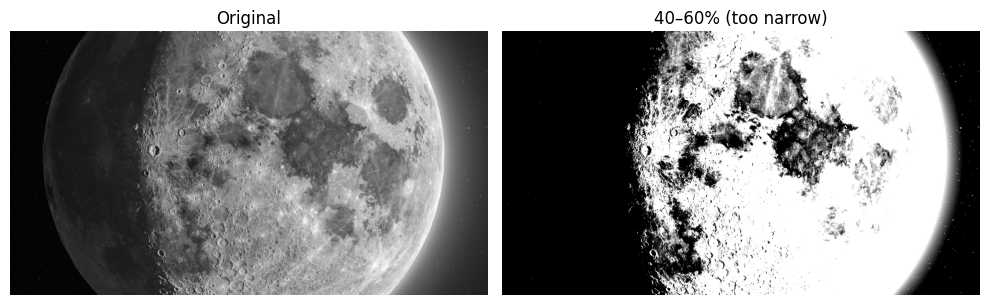

In [13]:
# TASK 3 — Contrast Stretching with different percentile pairs
def contrast_stretch(img, lo, hi):
    pl, ph = np.percentile(img, lo), np.percentile(img, hi)
    return np.clip((img.astype(np.float32) - pl) * 255.0 / (ph - pl + 1e-8), 0, 255).astype(np.uint8)

compare_images(
    [img_gray, contrast_stretch(img_gray,1,99), contrast_stretch(img_gray,5,95), contrast_stretch(img_gray,10,90)],
    ["Original", "1–99%", "5–95%", "10–90%"],
    cols=2, figsize=(14, 10)
)

compare_images(
    [img_gray, contrast_stretch(img_gray, 40, 60)],
    ["Original", "40–60% (too narrow)"],
    cols=2, figsize=(10, 5)
)

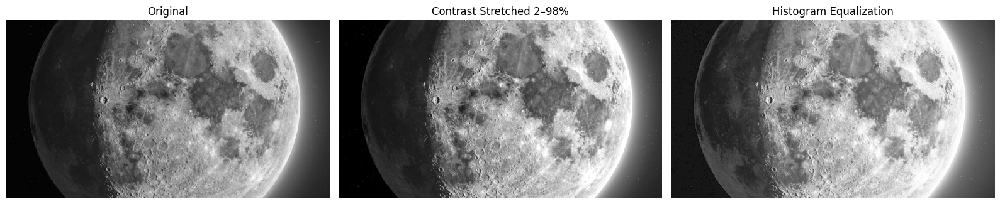

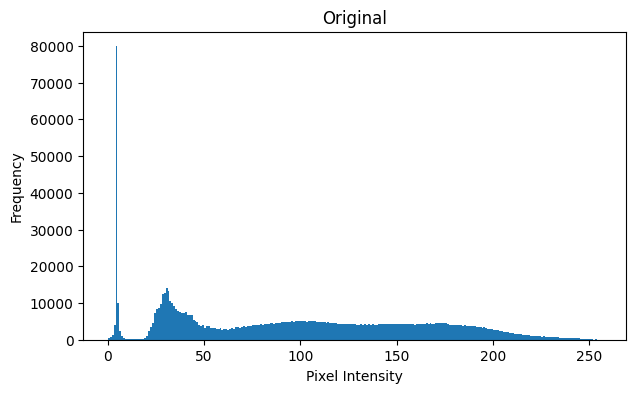

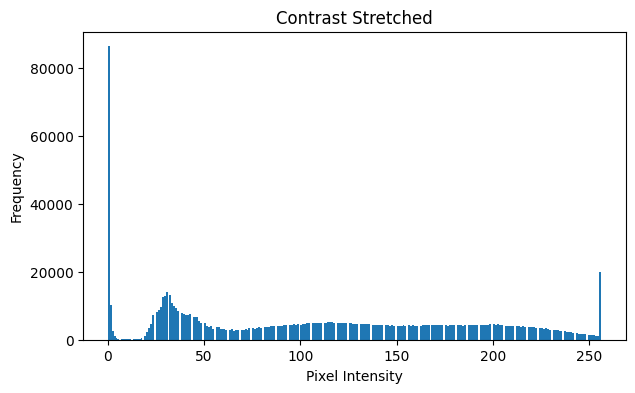

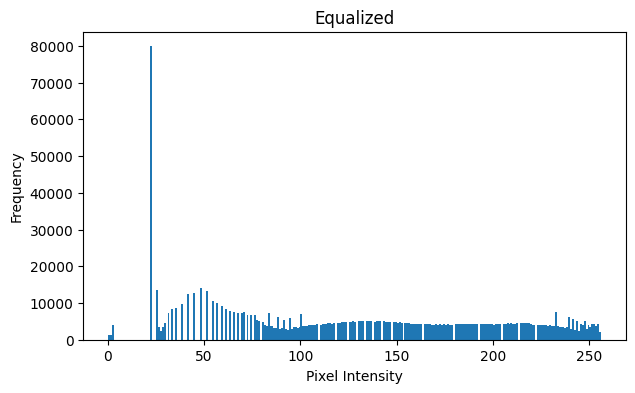

In [14]:
# TASK 4 — Histogram Equalization vs Contrast Stretching
hist_eq = cv2.equalizeHist(img_gray)
s_2_98  = contrast_stretch(img_gray, 2, 98)

compare_images(
    [img_gray, s_2_98, hist_eq],
    ["Original", "Contrast Stretched 2–98%", "Histogram Equalization"],
    cols=3, figsize=(16, 5)
)

plot_histogram(img_gray,  "Original")
plot_histogram(s_2_98,    "Contrast Stretched")
plot_histogram(hist_eq,   "Equalized")

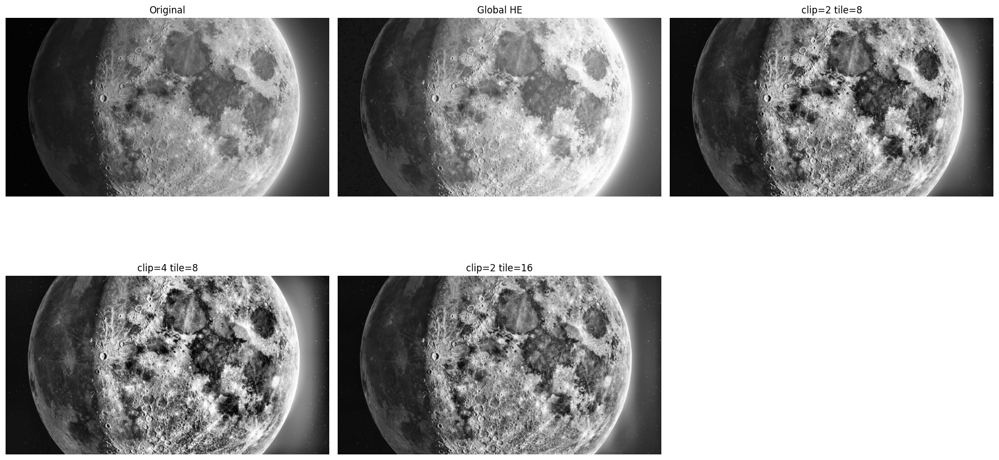

In [15]:
# TASK 5 — CLAHE parameter combinations
def apply_clahe(img, clip, tile):
    return cv2.createCLAHE(clipLimit=clip, tileGridSize=tile).apply(img)

compare_images(
    [img_gray, hist_eq,
     apply_clahe(img_gray, 2.0, (8,  8)),
     apply_clahe(img_gray, 4.0, (8,  8)),
     apply_clahe(img_gray, 2.0, (16, 16))],
    ["Original", "Global HE", "clip=2 tile=8", "clip=4 tile=8", "clip=2 tile=16"],
    cols=3, figsize=(18, 10)
)

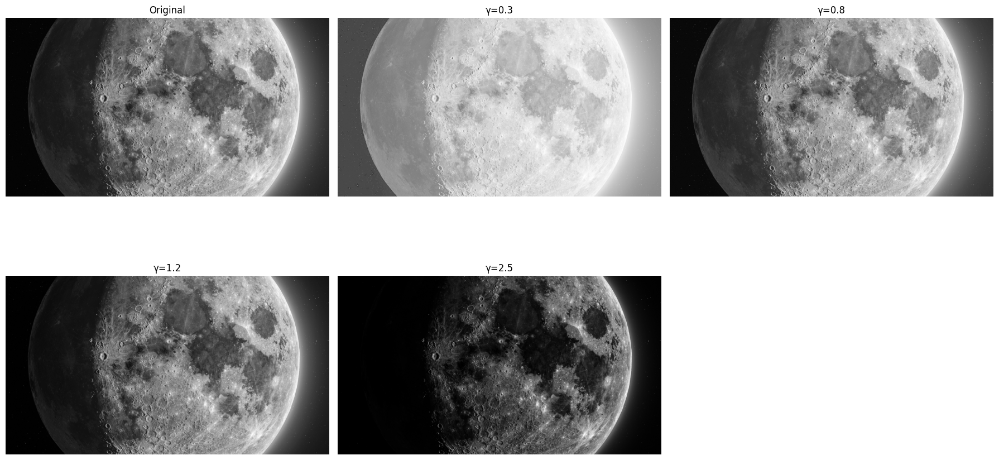

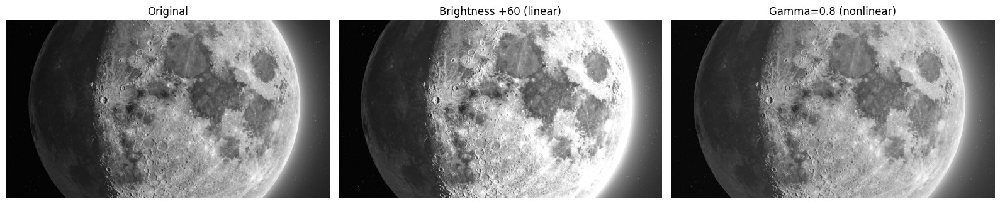

In [16]:
# TASK 6 — Gamma Correction: 0.3, 0.8, 1.2, 2.5
def gamma_correction(img, g):
    return np.clip(np.power(img / 255.0, g) * 255, 0, 255).astype(np.uint8)

compare_images(
    [img_gray, gamma_correction(img_gray, 0.3), gamma_correction(img_gray, 0.8),
               gamma_correction(img_gray, 1.2), gamma_correction(img_gray, 2.5)],
    ["Original", "γ=0.3", "γ=0.8", "γ=1.2", "γ=2.5"],
    cols=3, figsize=(18, 10)
)

brightness_add = np.clip(img_gray.astype(np.int32) + 60, 0, 255).astype(np.uint8)
compare_images(
    [img_gray, brightness_add, gamma_correction(img_gray, 0.8)],
    ["Original", "Brightness +60 (linear)", "Gamma=0.8 (nonlinear)"],
    cols=3, figsize=(16, 5)
)

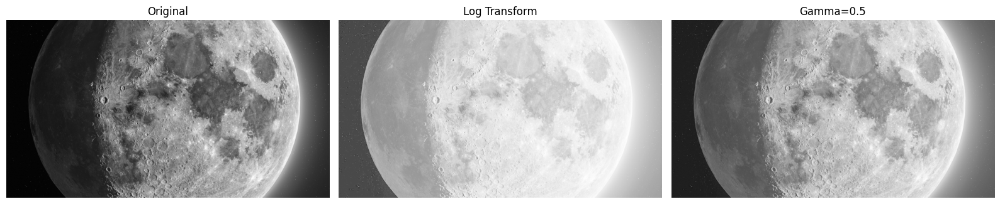

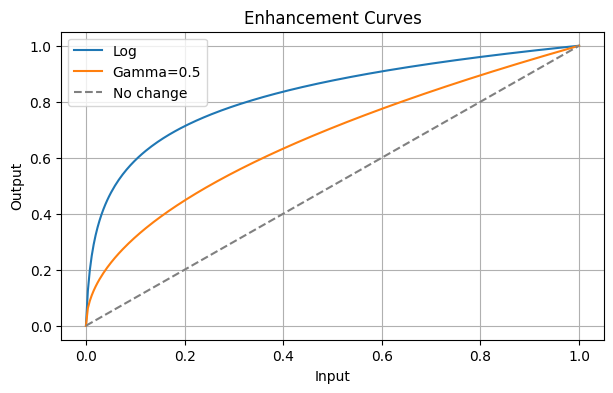

In [17]:
# TASK 7 — Log Transformation vs Gamma=0.5
c       = 255 / np.log(1 + np.max(img_f))
log_img = np.clip(c * np.log(1 + img_f), 0, 255).astype(np.uint8)

compare_images(
    [img_gray, log_img, gamma_correction(img_gray, 0.5)],
    ["Original", "Log Transform", "Gamma=0.5"],
    cols=3, figsize=(16, 5)
)

x = np.linspace(0, 1, 256)
plt.figure(figsize=(7, 4))
plt.plot(x, np.log(1 + x*255) / np.log(256), label="Log")
plt.plot(x, np.power(x, 0.5),                 label="Gamma=0.5")
plt.plot(x, x, "--", color="gray",             label="No change")
plt.xlabel("Input"); plt.ylabel("Output"); plt.title("Enhancement Curves")
plt.legend(); plt.grid(True); plt.show()

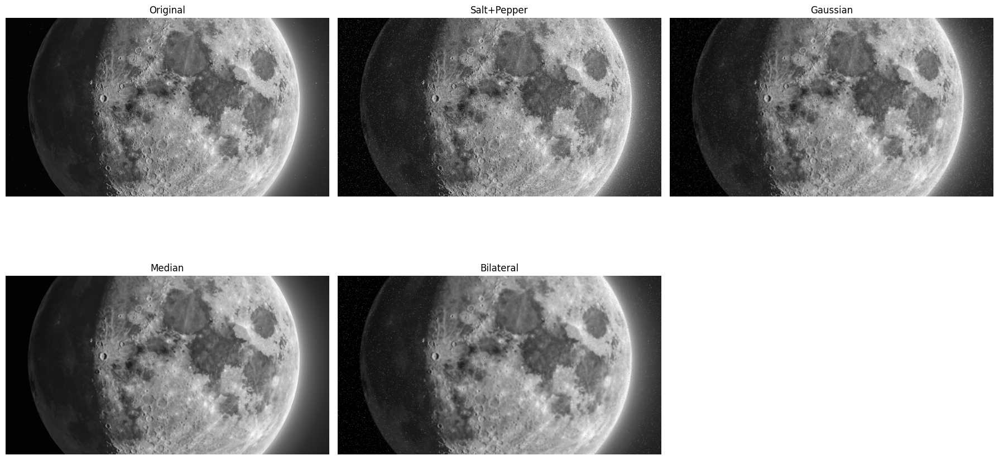

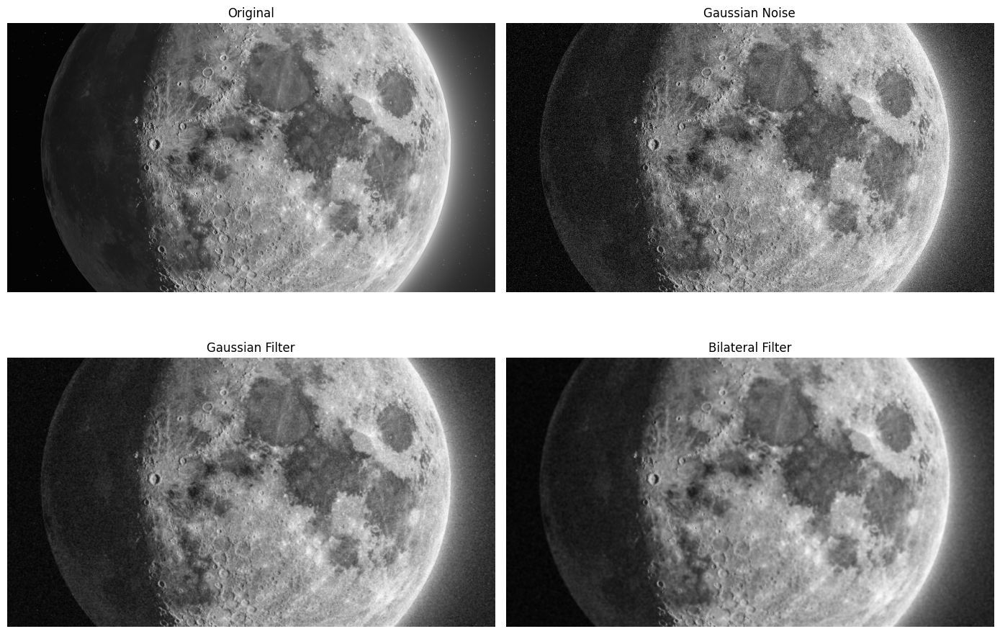

In [18]:
# TASK 8 — Synthetic Noise + Filter Comparison
rng   = np.random.default_rng(42)
noisy = img_gray.copy().astype(np.float32)
noisy[rng.random(img_gray.shape) < 0.01] = 255
noisy[rng.random(img_gray.shape) < 0.01] = 0
noisy = noisy.astype(np.uint8)

g_noise = np.clip(img_gray.astype(np.float32) + rng.normal(0, 25, img_gray.shape), 0, 255).astype(np.uint8)

compare_images(
    [img_gray, noisy,
     cv2.GaussianBlur(noisy, (5,5), 0),
     cv2.medianBlur(noisy, 5),
     cv2.bilateralFilter(noisy, 9, 75, 75)],
    ["Original", "Salt+Pepper", "Gaussian", "Median", "Bilateral"],
    cols=3, figsize=(18, 10)
)

compare_images(
    [img_gray, g_noise,
     cv2.GaussianBlur(g_noise, (5,5), 0),
     cv2.bilateralFilter(g_noise, 9, 75, 75)],
    ["Original", "Gaussian Noise", "Gaussian Filter", "Bilateral Filter"],
    cols=2, figsize=(14, 10)
)

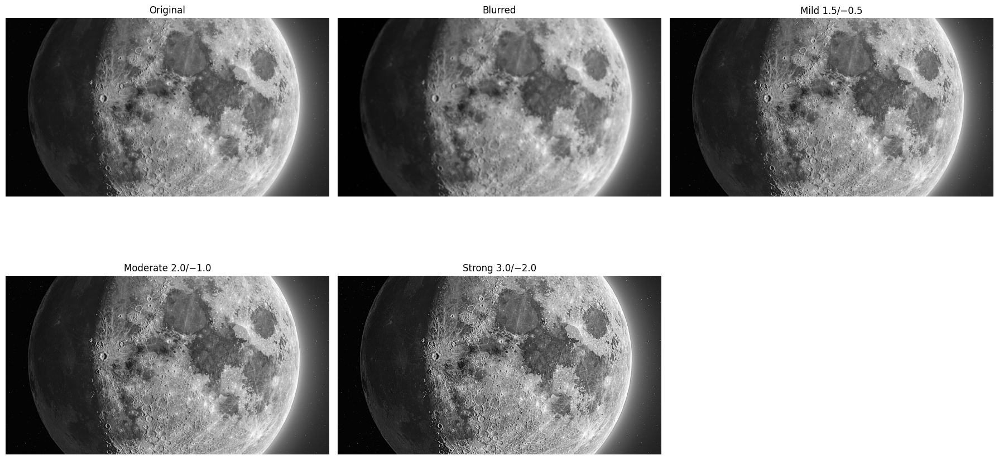

In [19]:
# TASK 9 — Sharpening: experiment with weights
blurred = cv2.GaussianBlur(img_gray, (9,9), 2.0)

compare_images(
    [img_gray, blurred,
     cv2.addWeighted(img_gray, 1.5, blurred, -0.5, 0),
     cv2.addWeighted(img_gray, 2.0, blurred, -1.0, 0),
     cv2.addWeighted(img_gray, 3.0, blurred, -2.0, 0)],
    ["Original", "Blurred", "Mild 1.5/−0.5", "Moderate 2.0/−1.0", "Strong 3.0/−2.0"],
    cols=3, figsize=(18, 10)
)

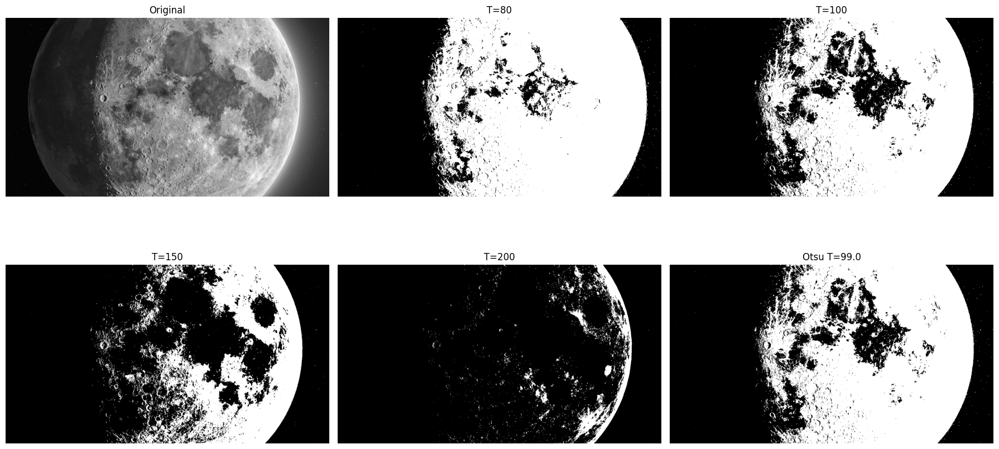

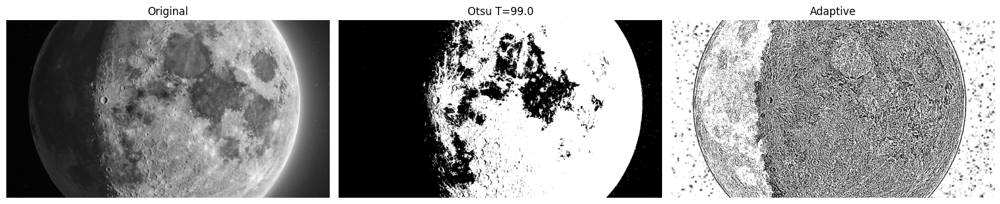

In [20]:
# TASK 10 — Thresholding: manual values vs Otsu vs Adaptive
_, th80  = cv2.threshold(img_gray,  80, 255, cv2.THRESH_BINARY)
_, th100 = cv2.threshold(img_gray, 100, 255, cv2.THRESH_BINARY)
_, th150 = cv2.threshold(img_gray, 150, 255, cv2.THRESH_BINARY)
_, th200 = cv2.threshold(img_gray, 200, 255, cv2.THRESH_BINARY)
otsu_val, th_otsu = cv2.threshold(img_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
th_adapt = cv2.adaptiveThreshold(img_gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)

compare_images(
    [img_gray, th80, th100, th150, th200, th_otsu],
    ["Original", "T=80", "T=100", "T=150", "T=200", f"Otsu T={otsu_val}"],
    cols=3, figsize=(18, 10)
)

compare_images(
    [img_gray, th_otsu, th_adapt],
    ["Original", f"Otsu T={otsu_val}", "Adaptive"],
    cols=3, figsize=(16, 5)
)

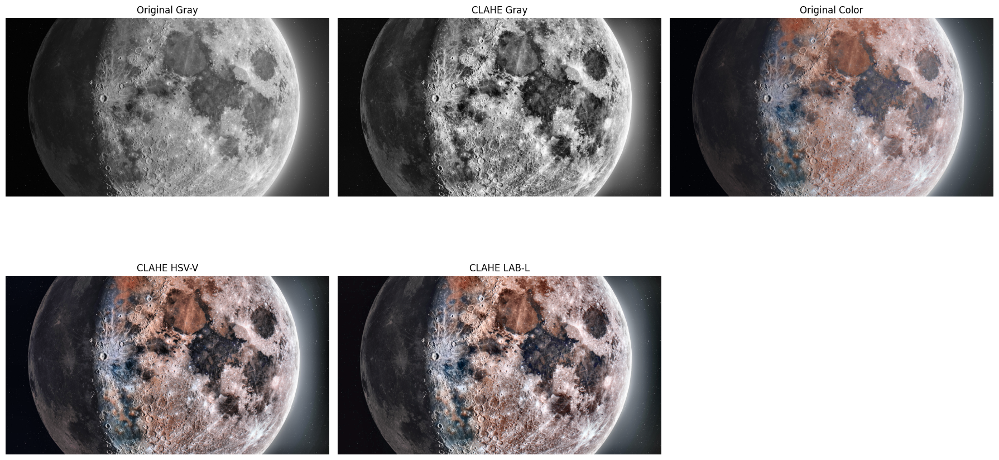

In [21]:
# TASK 11 — CLAHE on Grayscale, HSV-V, and LAB-L
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))

clahe_gray = clahe.apply(img_gray)

h, s, v   = cv2.split(cv2.cvtColor(img_color, cv2.COLOR_BGR2HSV))
color_hsv  = cv2.cvtColor(cv2.merge((h, s, clahe.apply(v))), cv2.COLOR_HSV2BGR)

l, a, b   = cv2.split(cv2.cvtColor(img_color, cv2.COLOR_BGR2LAB))
color_lab  = cv2.cvtColor(cv2.merge((clahe.apply(l), a, b)), cv2.COLOR_LAB2BGR)

compare_images(
    [img_gray, clahe_gray, img_color, color_hsv, color_lab],
    ["Original Gray", "CLAHE Gray", "Original Color", "CLAHE HSV-V", "CLAHE LAB-L"],
    cols=3, figsize=(18, 10)
)